In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
import warnings
warnings.filterwarnings('ignore')
import os
from scipy import signal
import scipy.signal as ss
import glob
from PIL import Image


Bad key "text.kerning_factor" on line 4 in
C:\Users\ZhangSonglin\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [ ]:
def cell_lines_process(self, el_data):
        ''' 寻找电池片切线位置接口
        '''
        # get img info
#         img_info = el_data.img_info
        img = img_info.img_cv2
        rows, cols = img_info.rows, img_info.cols
        row_bias, col_bias = img_info.row_lines[0], img_info.col_lines[0]
        row_final_line = img_info.row_lines[-1]
        col_final_line = img_info.col_lines[-1]
        # get img cut to get avg original lines
        img_cut = img[img_info.row_lines[0]:img_info.row_lines[1], img_info.col_lines[0]:img_info.col_lines[1]]
        hh, ww = img_cut.shape[:2]
        row_lines_avg, col_lines_avg = get_avg_cell_lines(img_cut, rows, cols)

        delta_x = ww//cols//6
        delta_y = hh//rows//6
        img_gray = img_cut[:, :, 0] if img_cut.ndim == 3 else img_cut
        horizontal = np.sum(img_gray, axis=0)
        vertical = np.sum(img_gray, axis=1)
        # 电池片水平栅格线有可能干扰到电池片的水平切割，特别处理下
        conv_width_half = hh//(rows*90)
        vertical = np.convolve(vertical, np.ones(
            conv_width_half*2 + 1).astype('int'))[conv_width_half: -1*conv_width_half]

        for ii in range(len(row_lines_avg)):
            pos = row_lines_avg[ii]
            r0, r1 = max(0, pos-delta_y), min(hh-1, pos+delta_y)
            row_lines_avg[ii] = int(np.argmin(vertical[r0: r1]) + r0)

        for ii in range(len(col_lines_avg)):
            pos = col_lines_avg[ii]
            r0, r1 = max(0, pos-delta_x), min(ww-1, pos+delta_x)
            col_lines_avg[ii] = int(np.argmin(horizontal[r0: r1]) + r0)

        row_lines = [x+row_bias for x in row_lines_avg]
        col_lines = [x+col_bias for x in col_lines_avg]
        row_lines[0] = row_bias
        row_lines[-1] = row_final_line
        col_lines[0] = col_bias
        col_lines[-1] = col_final_line
        # 校验两条切线的差值是否大于片的10%
        row_lines1 = np.array(el_data.img_info.row_lines.copy())
        col_lines1 = np.array(el_data.img_info.col_lines.copy())
        threshold_x = ww//cols//10
        threshold_y = hh//rows//10
        del_row_lines = row_lines1[1:] - row_lines1[0:-1]
        del_col_lines = col_lines1[1:] - col_lines1[0:-1]
        x = np.max(del_row_lines) - np.min(del_row_lines)
        y = np.max(del_col_lines) - np.min(del_col_lines)
        if x > threshold_x or y > threshold_y:
            raise Exception("Sorry, rows or lines not satisfied!")
        # rows and lines satisfied
        el_data.img_info.row_lines = row_lines
        el_data.img_info.col_lines = col_lines

In [168]:
def insert_lines(array_lines):
    array_diff = np.diff(array_lines)
    index_max = np.argwhere(array_diff==max(array_diff))[0][0]
    list_lines = list(array_lines)
    num_insert = int(round(max(array_diff)/min(array_diff), 0))
    print(num_insert)
    for i in range(1, num_insert):
        list_lines.append(array_lines[index_max] + i*((array_lines[index_max+1]-array_lines[index_max])//num_insert))
    list_lines = sorted(list_lines)
    array_lines_res = np.array(list_lines)
    
    return array_lines_res

In [169]:
def get_cell_lines(img_cut, cell_height, rows, cols):
    kernel =np.ones((11,1))/11
    dst = cv2.filter2D(img_cut, -1, kernel)
    binary = cv2.threshold(dst, 0, 255, cv2.THRESH_OTSU)[1]
    img_blur = cv2.medianBlur(binary, 25)
    
    padded_row = int(cell_height*0.8)
    padded_col = int(cell_height*0.25)

    row_diff = np.diff(img_blur.mean(1)[padded_row: -padded_row])
    col_diff = np.diff(img_blur.mean(0)[padded_col: -padded_col])
#     plt.plot(col_diff)
#     plt.show()
    row_max = ss.argrelmax(row_diff, order=int(cell_height * 0.9))[0]
    row_min = ss.argrelmin(row_diff[row_max[0]:], order=int(cell_height * 0.9))[0]
    row_min = row_min+row_max[0]
#     print(row_max)
#     print(row_min)
#     plt.plot(row_diff)
#     for line in row_max:
#         plt.axvline(line,c="r")
#     for line in row_min:
#         plt.axvline(line,c="b")
#     plt.show()
    # x_edge = self.normal_distribution(np.linspace(-3, 3, int(len(row_diff)*0.1)), 0, 1)
    # mean_row = np.convolve(row_diff, x_edge, 'same')

    # line_mid_max = self.argrelmax(mean_row, order =cell_height)[0]
    # line_mid_min = self.argrelmin(mean_row, order =cell_height)[0]
    # line_mid = (line_mid_max + line_mid_min) / 2 + padded_row

    col_max = ss.argrelmax(col_diff, order=int(cell_height / 2 * 0.9))[0]
    col_min = ss.argrelmin(col_diff, order=int(cell_height / 2 * 0.9))[0]
#     print('========row_max=========:{}'.format(row_max))
#     print('========row_min=========:{}'.format(row_min))
#     print('========col_max=========:{}'.format(col_max))
#     print('========col_min=========:{}'.format(col_min))
    h = img_cut.shape[0]
    if len(row_max)==0:
        row_max = np.array([h//2])
    if len(row_min)==0:
        row_min = np.array([h//2])
    if len(col_max)==cols-2:
        col_max = insert_lines(col_max)
    if len(col_min)==cols-2:
        col_min = insert_lines(col_min) 
    plt.plot(col_diff)
    for line in col_max:
        plt.axvline(line,c="r")
    for line in col_min:
        plt.axvline(line,c="b")
    plt.show()
    assert len(row_max) == len(row_min) == rows - 1, 'row lines length error'
    assert len(col_max) == len(col_min) == cols - 1, 'col lines length error'

    row_lines = (row_max + row_min) / 2 + padded_row
    col_lines = (col_max + col_min) / 2 + padded_col
#     print('========row_lines=========:{}'.format(row_lines))
#     print('========col_lines=========:{}'.format(col_lines))
#     if abs(row_lines[0] - cell_height) > 20:
#         row_lines[0] = cell_height
    plt.imshow(img_cut)
    for line in row_lines:
        plt.axhline(line,c="r")
    for line in col_lines:
        plt.axvline(line,c="r")
    plt.show()
    return row_lines.astype('int'), col_lines.astype('int')

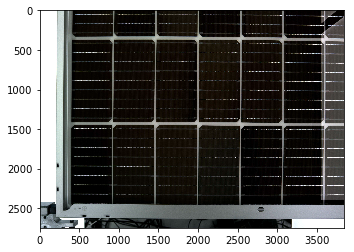

In [17]:
img = cv2.imread(r'C:\zhongjian\data\M10\M10_pic\pic\SWG-2021-11-16-16-05-51_0.jpg')
plt.imshow(img)

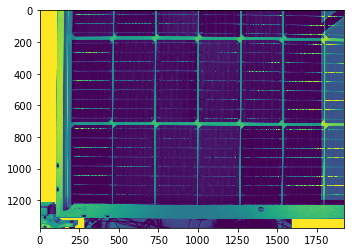

In [54]:
y, x = img.shape[:2]
img_rs = cv2.resize(img, (int(x/2), int(y/2)))
img_gray = cv2.cvtColor(img_rs, cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray)

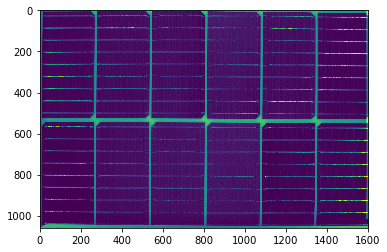

In [56]:
img_cut = img_gray[180:1240, 190:1790]
plt.imshow(img_cut)

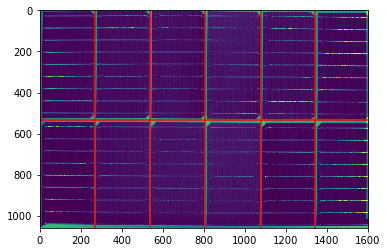

(array([536]), array([ 267,  535,  806, 1076, 1343]))

In [92]:
get_cell_lines(img_cut, 540, 2, 6)

In [136]:
def seek_cell_lines(pic_dir, cell_height, rows, cols):
    os.chdir(pic_dir)
    for img_path in glob.glob('*.jpg'):
        print(img_path)
        img = cv2.imread(img_path)
#         y, x = img.shape[:2]
#         img_rs = cv2.resize(img, (int(x/2), int(y/2)))
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        get_cell_lines(img_gray, cell_height, 2, 6)

SWG-2021-11-18-19-44-54_0.jpg
2


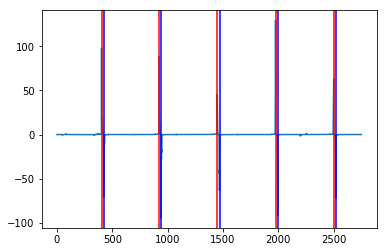

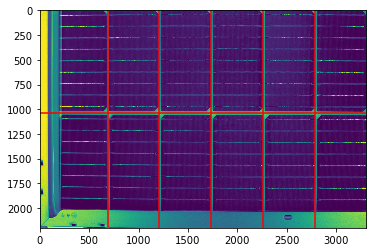

SWG-2021-11-18-19-44-54_1.jpg


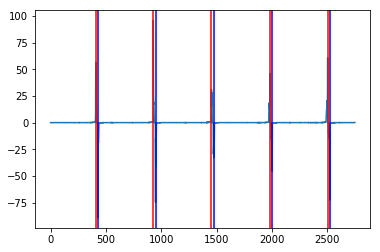

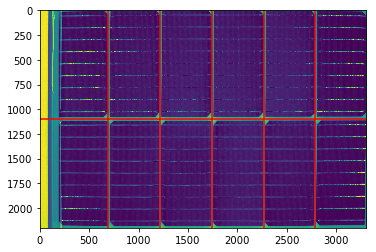

SWG-2021-11-18-19-44-54_10.jpg


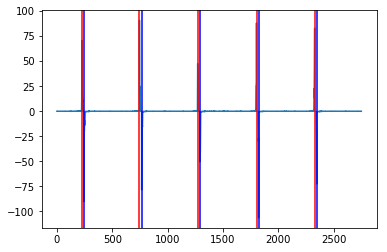

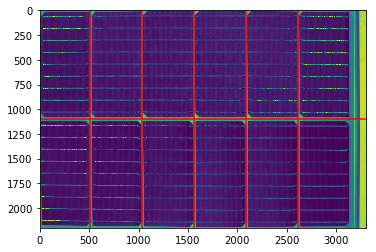

SWG-2021-11-18-19-44-54_11.jpg


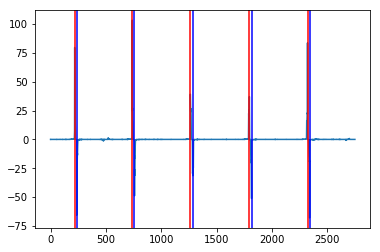

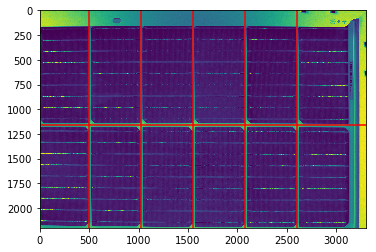

SWG-2021-11-18-19-44-54_2.jpg


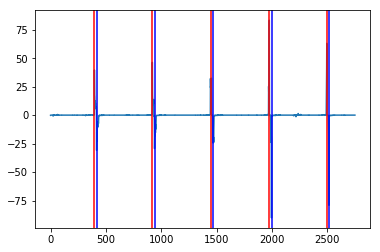

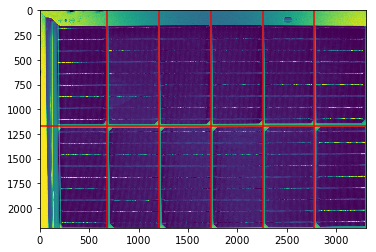

SWG-2021-11-18-19-44-54_3.jpg


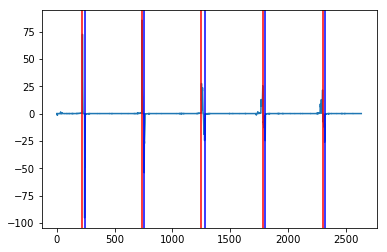

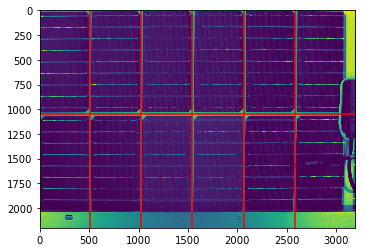

SWG-2021-11-18-19-44-54_4.jpg


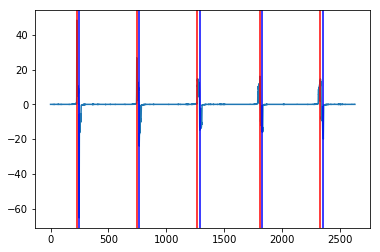

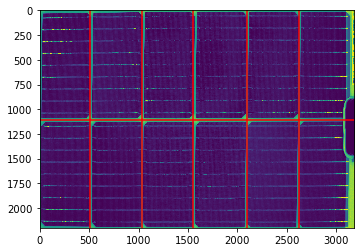

SWG-2021-11-18-19-44-54_5.jpg


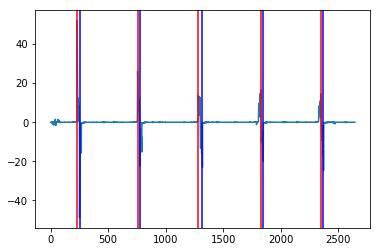

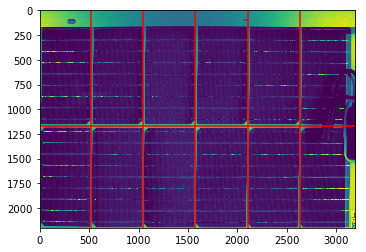

SWG-2021-11-18-19-44-54_6.jpg


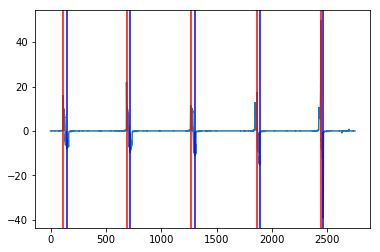

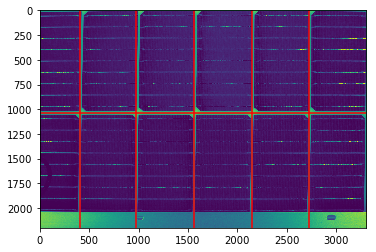

SWG-2021-11-18-19-44-54_7.jpg


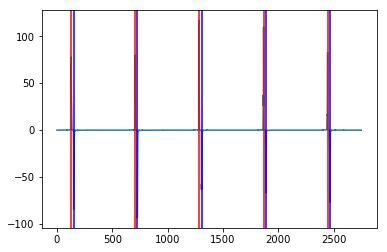

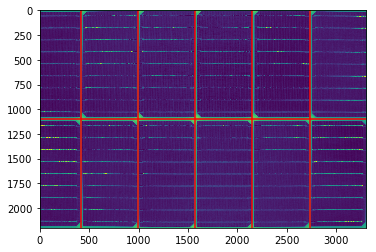

SWG-2021-11-18-19-44-54_8.jpg


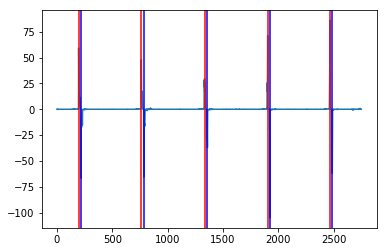

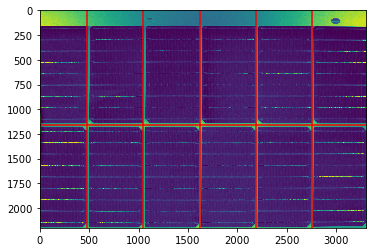

SWG-2021-11-18-19-44-54_9.jpg


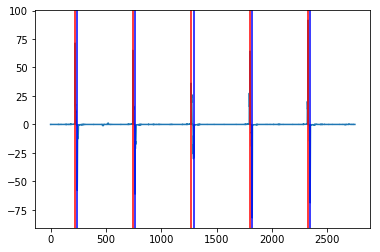

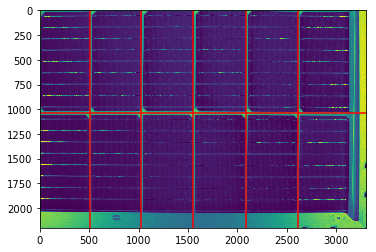

SWG-2021-11-18-19-53-00_0.jpg


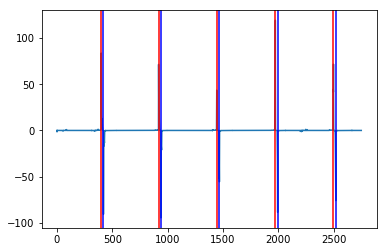

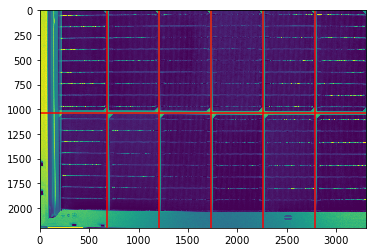

SWG-2021-11-18-19-53-00_1.jpg


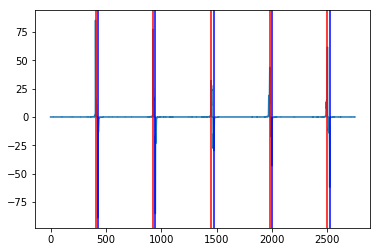

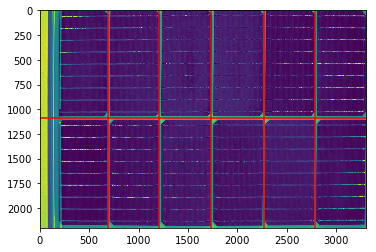

SWG-2021-11-18-19-53-00_10.jpg


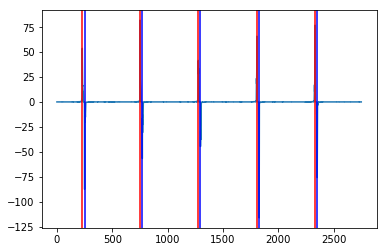

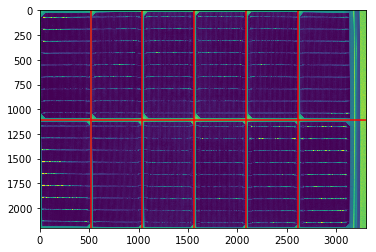

SWG-2021-11-18-19-53-00_11.jpg


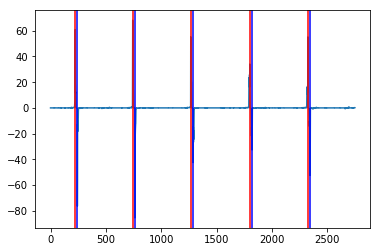

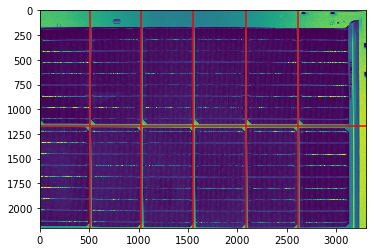

SWG-2021-11-18-19-53-00_2.jpg


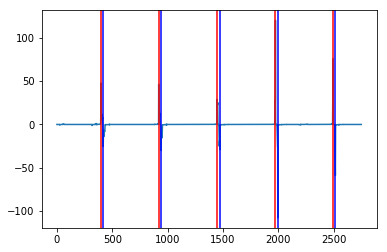

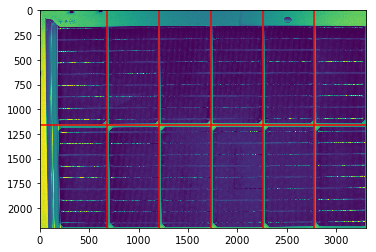

SWG-2021-11-18-19-53-00_3.jpg


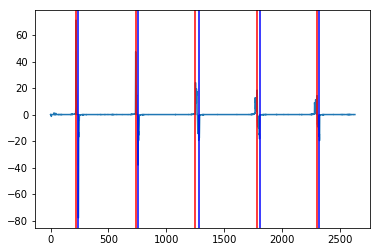

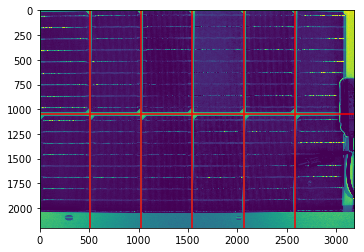

SWG-2021-11-18-19-53-00_4.jpg


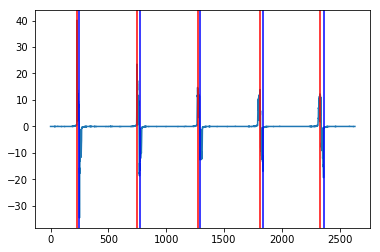

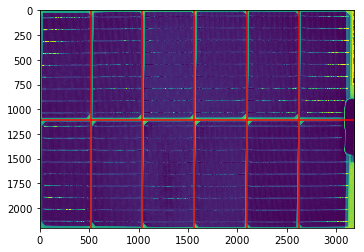

SWG-2021-11-18-19-53-00_5.jpg


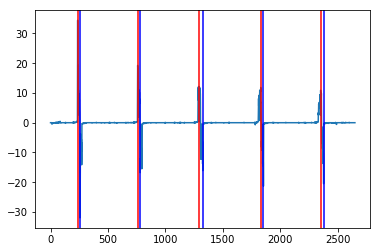

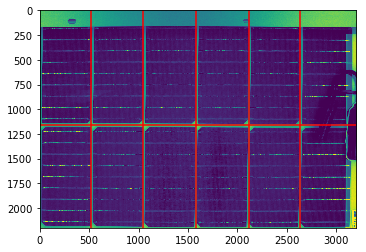

SWG-2021-11-18-19-53-00_6.jpg


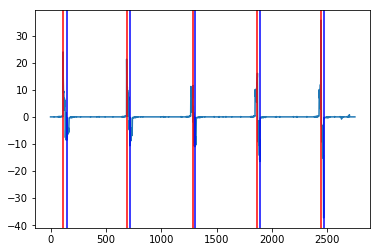

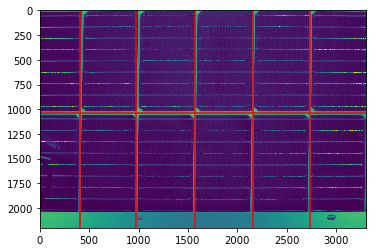

SWG-2021-11-18-19-53-00_7.jpg


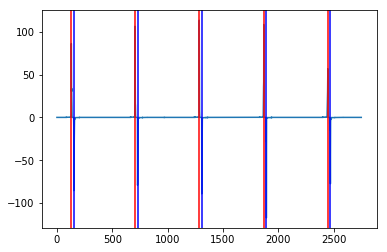

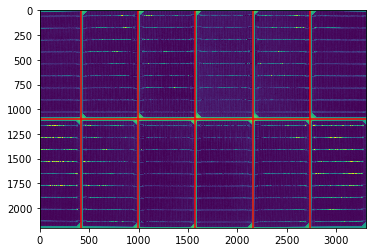

SWG-2021-11-18-19-53-00_8.jpg


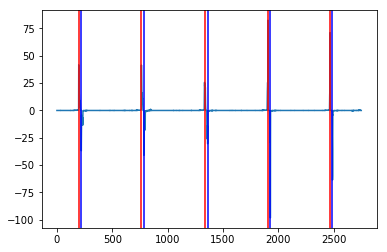

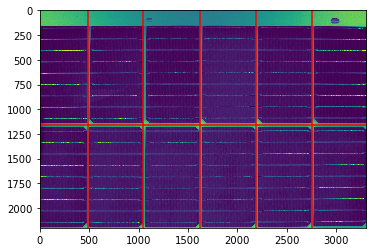

SWG-2021-11-18-19-53-00_9.jpg


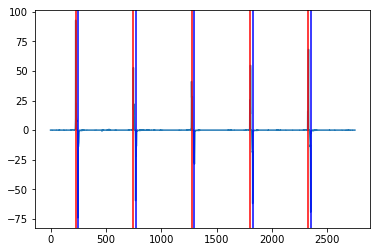

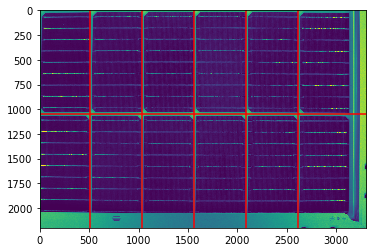

SWG-LRP904100211102404118_0.jpg


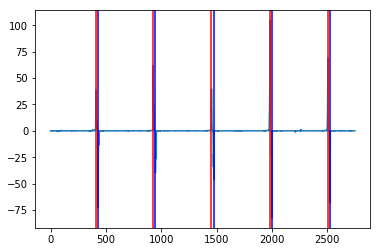

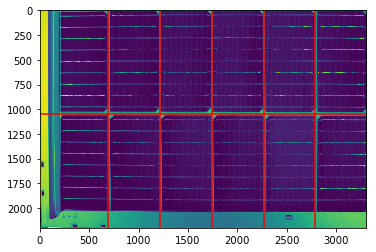

SWG-LRP904100211102404118_1.jpg


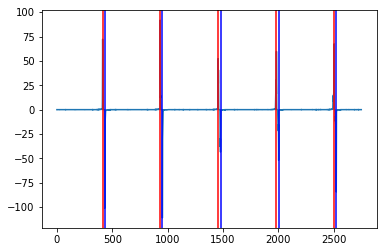

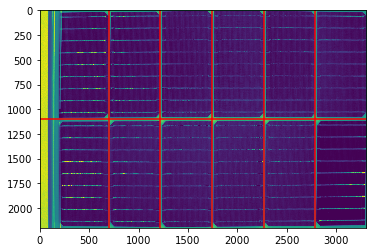

SWG-LRP904100211102404118_10.jpg


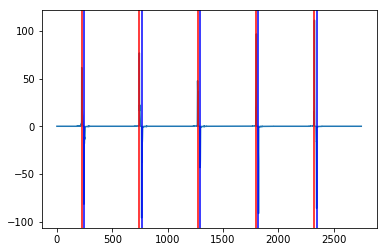

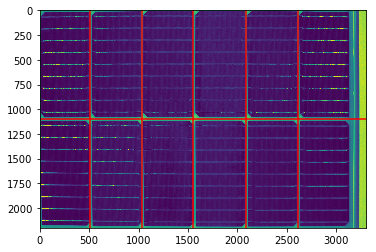

SWG-LRP904100211102404118_11.jpg


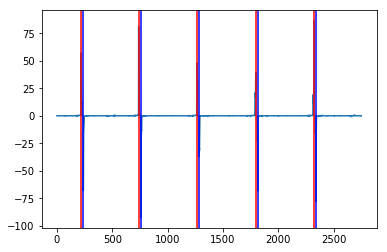

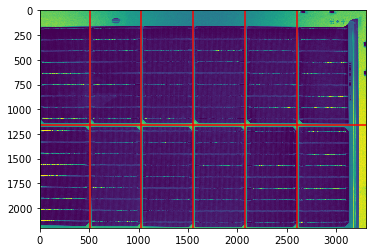

SWG-LRP904100211102404118_2.jpg


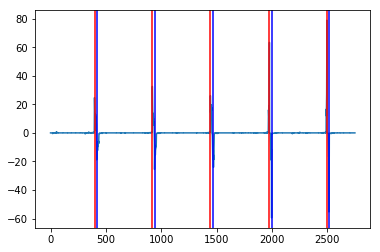

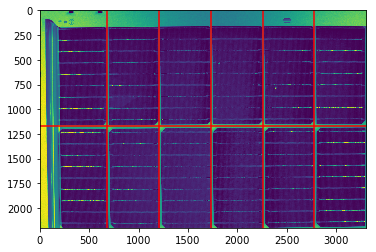

SWG-LRP904100211102404118_3.jpg


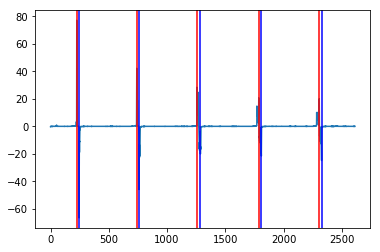

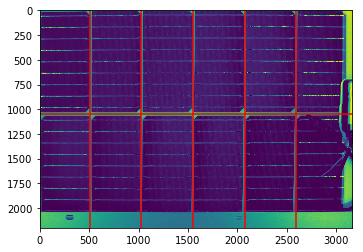

SWG-LRP904100211102404118_4.jpg


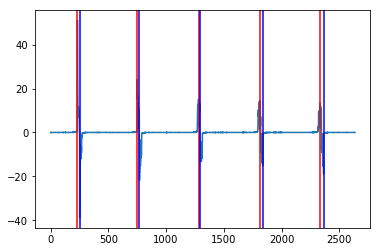

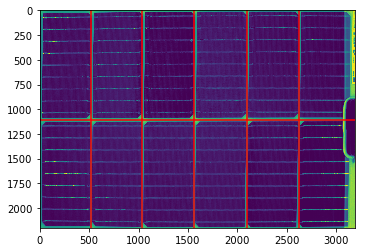

SWG-LRP904100211102404118_5.jpg


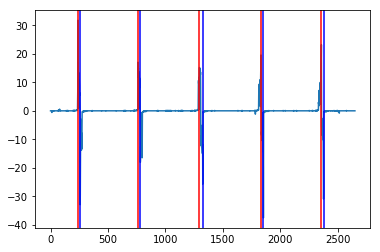

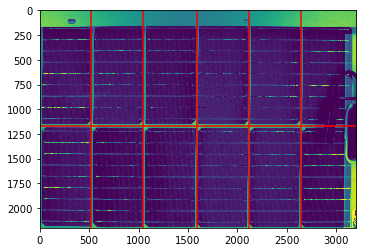

SWG-LRP904100211102404118_6.jpg
2


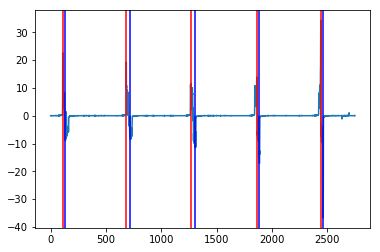

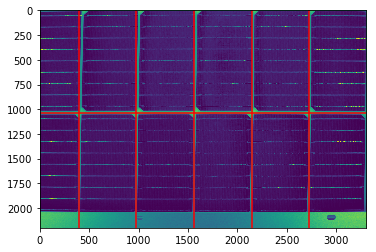

SWG-LRP904100211102404118_7.jpg


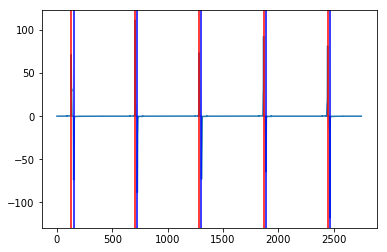

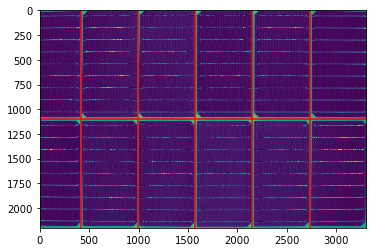

SWG-LRP904100211102404118_8.jpg


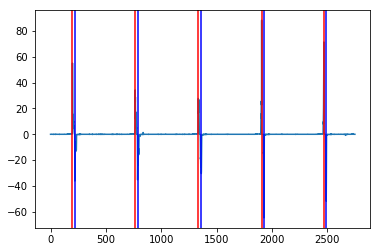

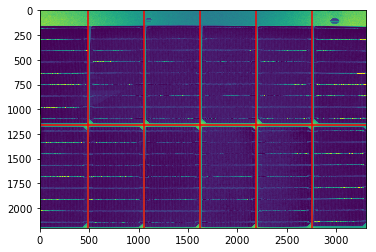

SWG-LRP904100211102404118_9.jpg


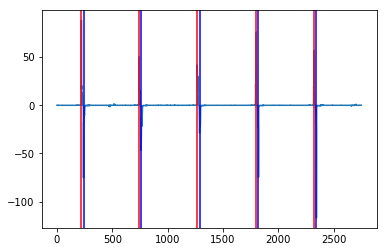

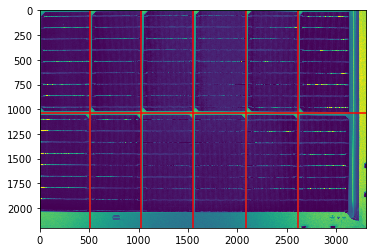

SWG-LRP904100211102415224_0.jpg


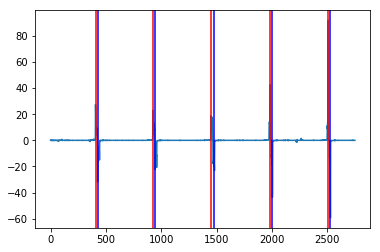

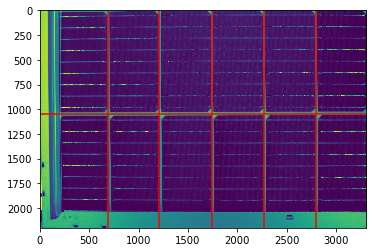

SWG-LRP904100211102415224_1.jpg


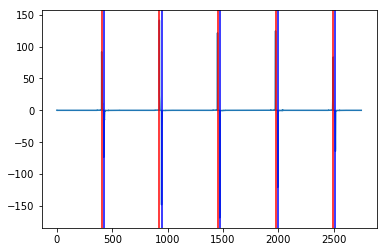

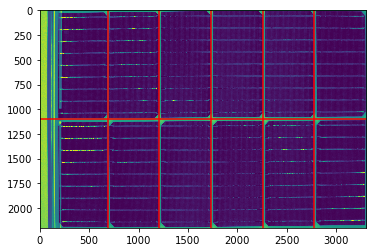

SWG-LRP904100211102415224_10.jpg


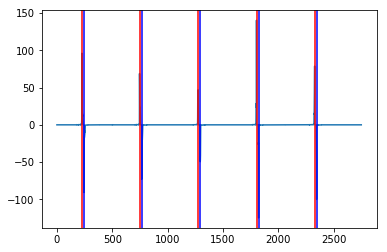

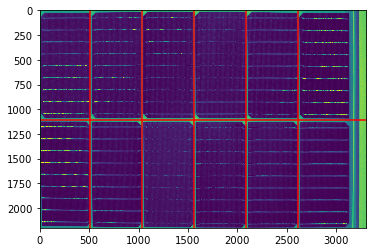

SWG-LRP904100211102415224_11.jpg


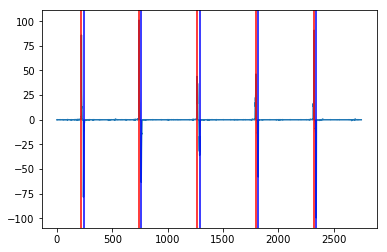

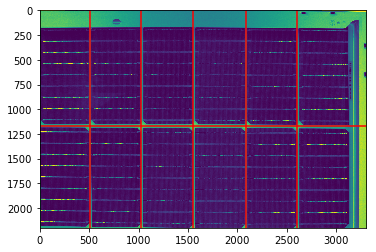

SWG-LRP904100211102415224_2.jpg


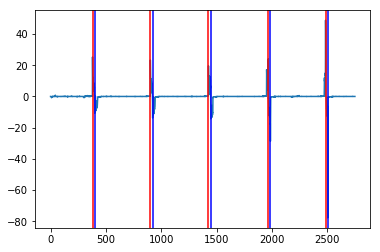

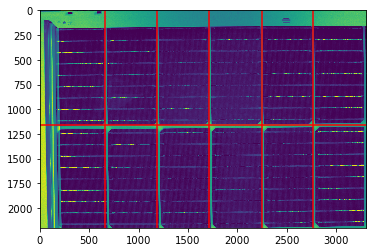

SWG-LRP904100211102415224_3.jpg


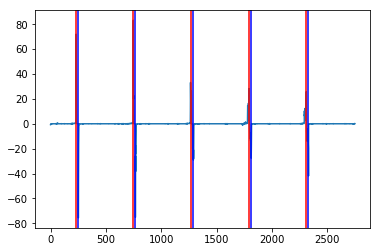

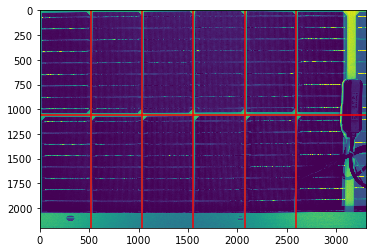

SWG-LRP904100211102415224_4.jpg


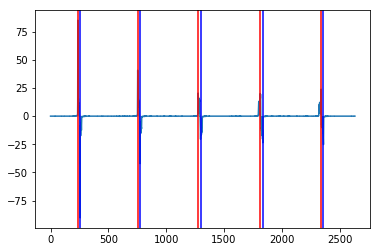

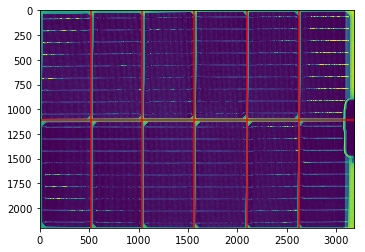

SWG-LRP904100211102415224_5.jpg


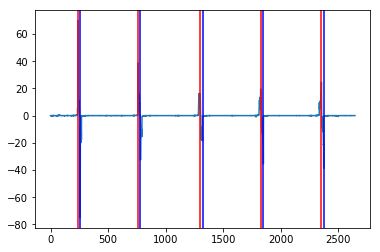

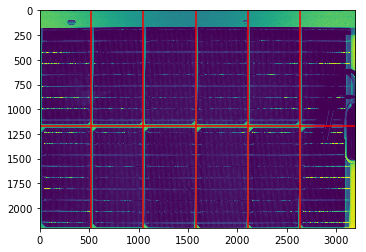

SWG-LRP904100211102415224_6.jpg


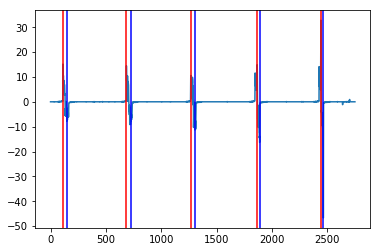

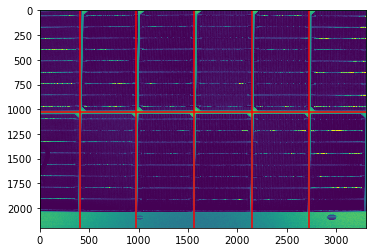

SWG-LRP904100211102415224_7.jpg
2


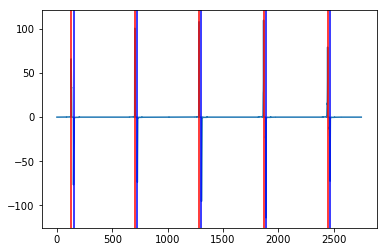

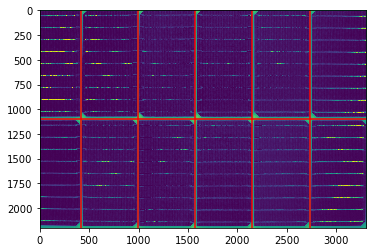

SWG-LRP904100211102415224_8.jpg


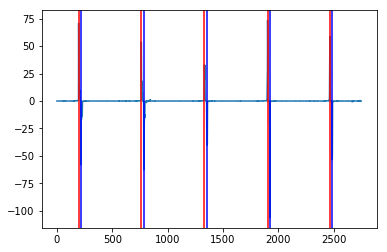

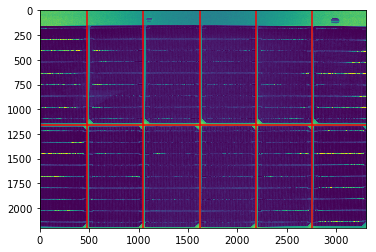

SWG-LRP904100211102415224_9.jpg


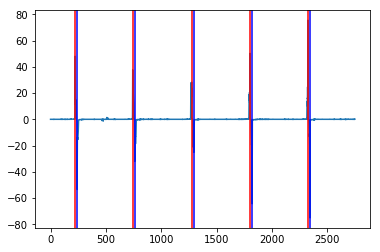

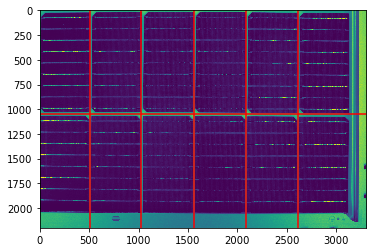

SWG-LRP904100211102415997_0.jpg


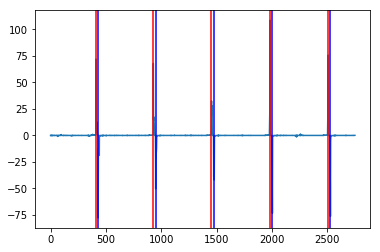

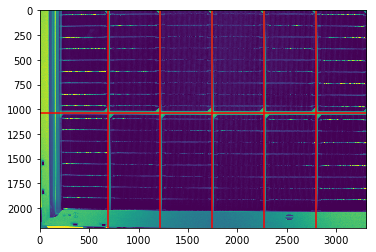

SWG-LRP904100211102415997_1.jpg


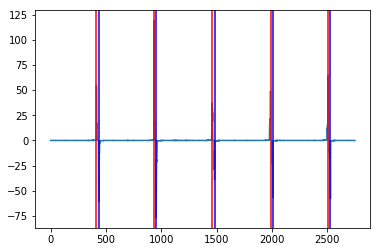

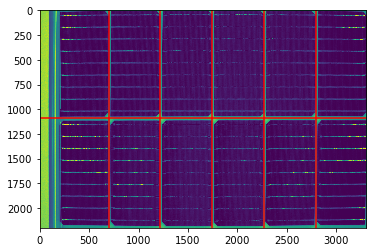

SWG-LRP904100211102415997_10.jpg


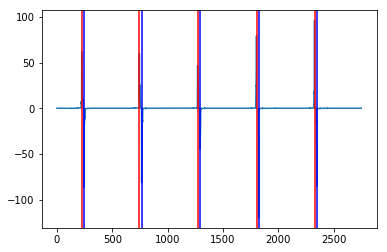

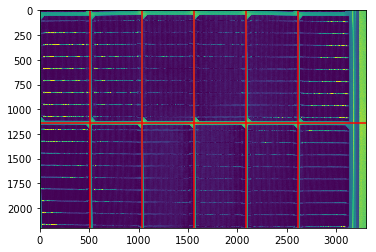

SWG-LRP904100211102415997_11.jpg


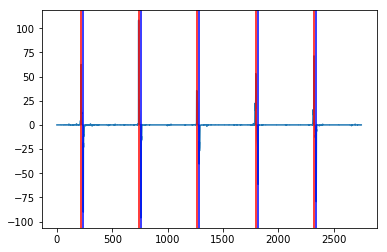

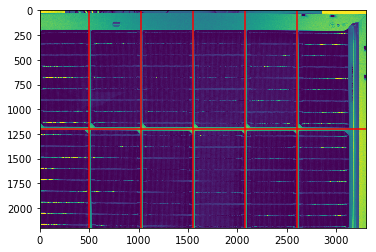

SWG-LRP904100211102415997_2.jpg


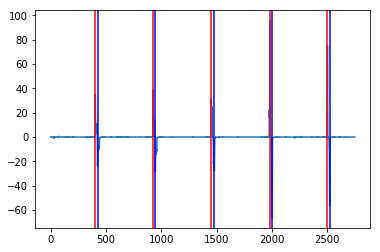

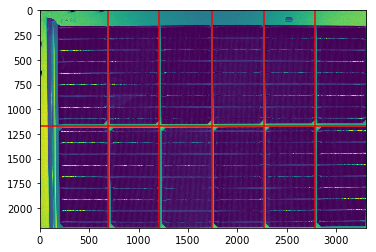

SWG-LRP904100211102415997_3.jpg


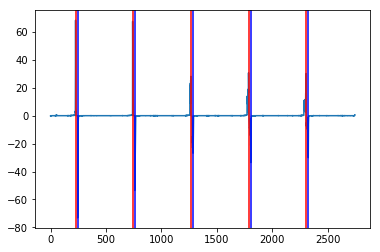

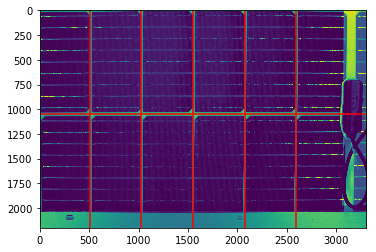

SWG-LRP904100211102415997_4.jpg


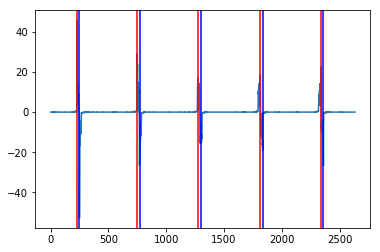

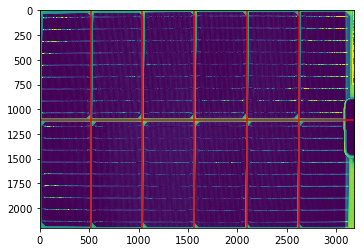

SWG-LRP904100211102415997_5.jpg


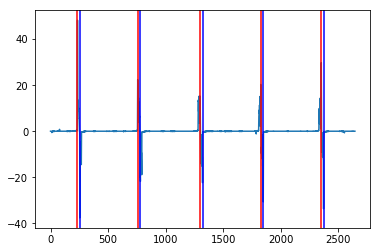

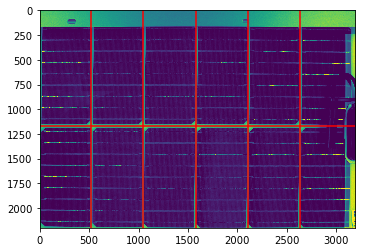

SWG-LRP904100211102415997_6.jpg
2


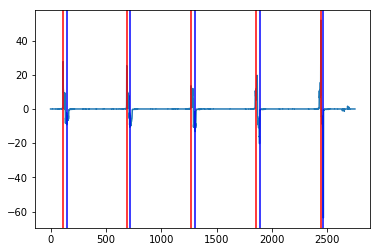

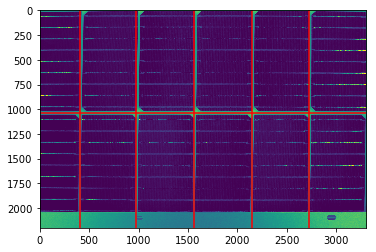

SWG-LRP904100211102415997_7.jpg


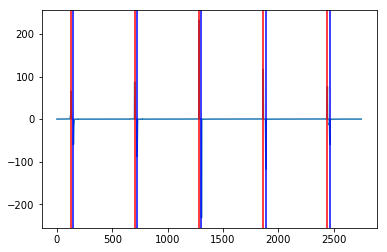

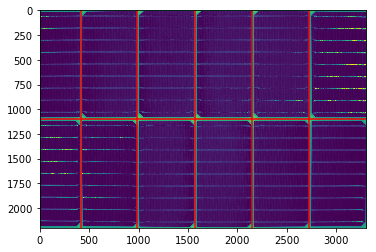

SWG-LRP904100211102415997_8.jpg


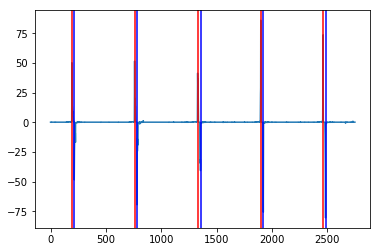

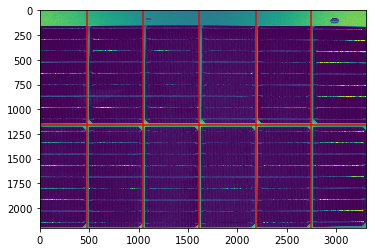

SWG-LRP904100211102415997_9.jpg


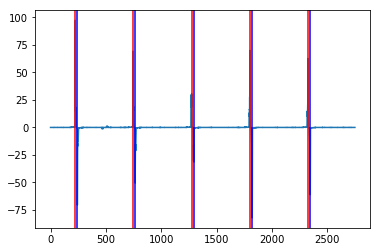

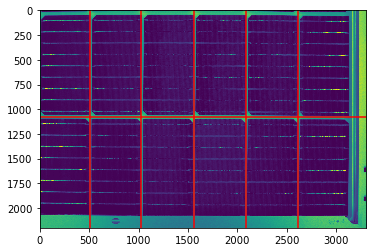

SWG-LRP904100211102417529_0.jpg


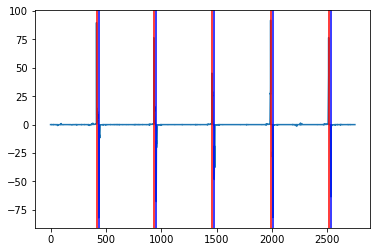

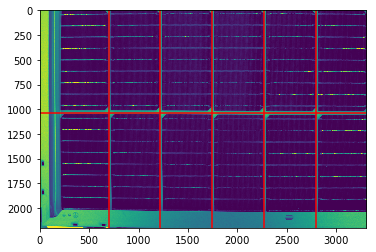

SWG-LRP904100211102417529_1.jpg


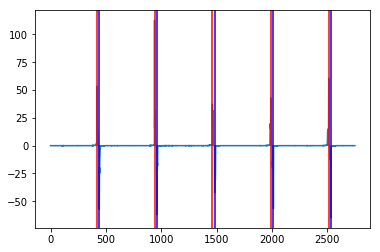

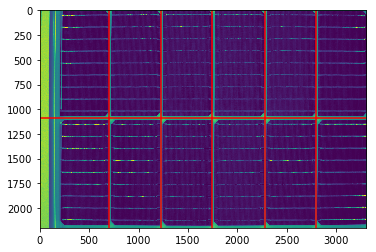

SWG-LRP904100211102417529_10.jpg


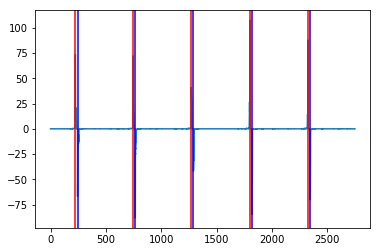

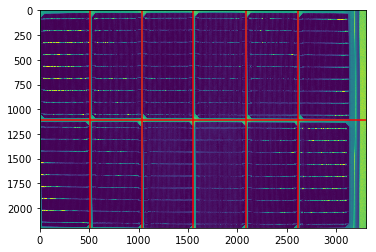

SWG-LRP904100211102417529_11.jpg


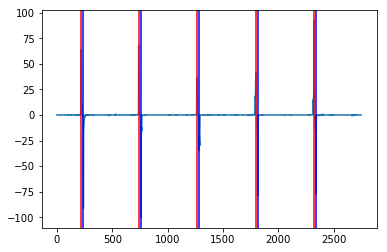

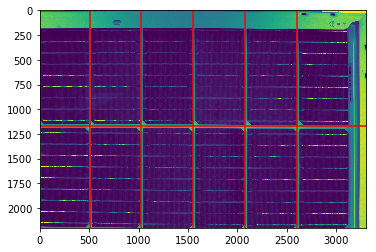

SWG-LRP904100211102417529_2.jpg


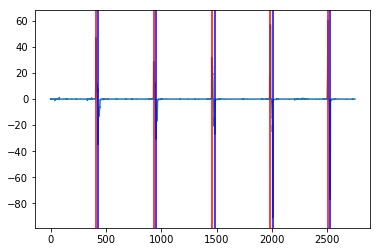

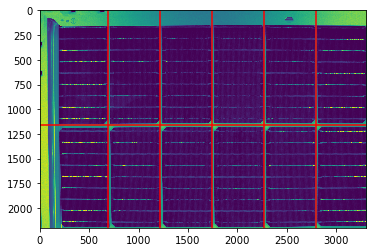

SWG-LRP904100211102417529_3.jpg
2


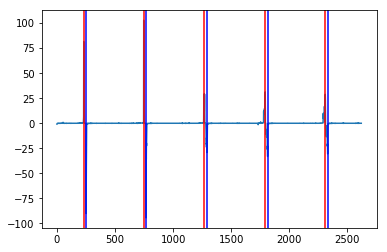

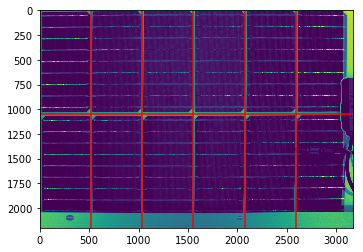

SWG-LRP904100211102417529_4.jpg


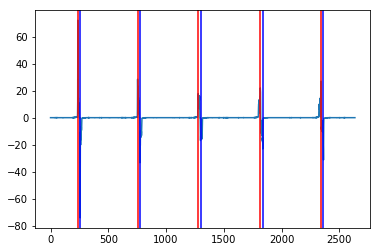

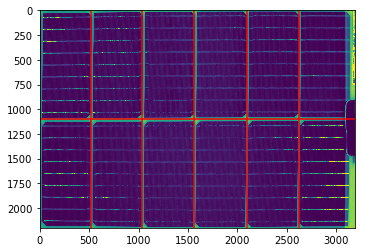

SWG-LRP904100211102417529_5.jpg


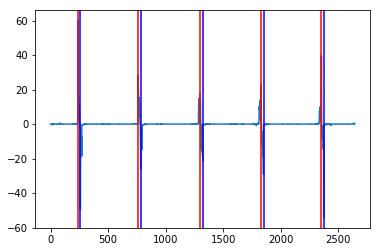

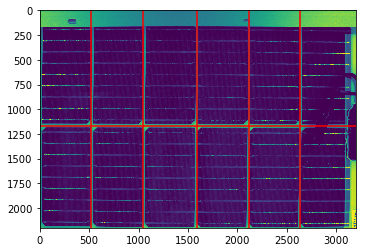

SWG-LRP904100211102417529_6.jpg
2


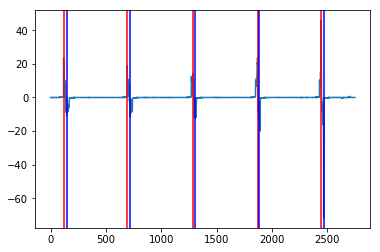

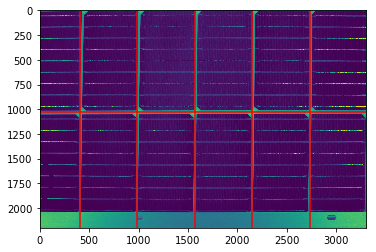

SWG-LRP904100211102417529_7.jpg


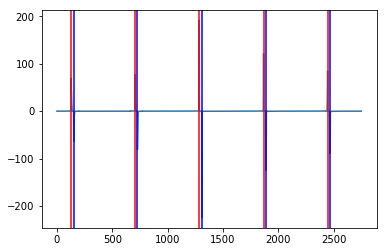

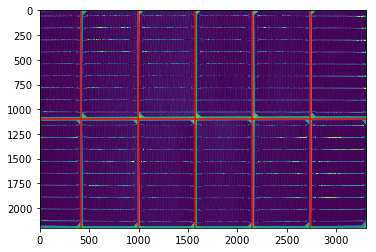

SWG-LRP904100211102417529_8.jpg


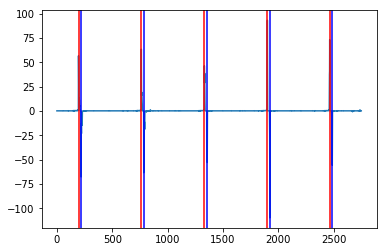

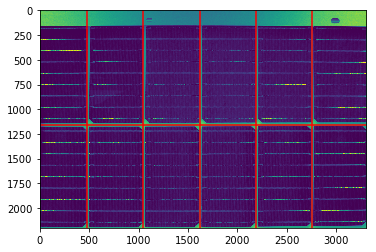

SWG-LRP904100211102417529_9.jpg


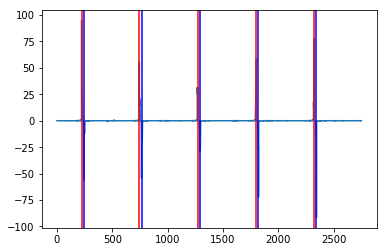

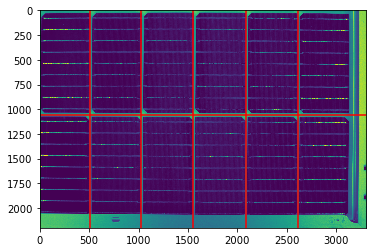

In [170]:
pic_dir = r'C:\zhongjian\cut_pics\data\jiexianhe\cut_edge'
cell_height = 1100
rows = 2
cols = 6
seek_cell_lines(pic_dir, cell_height, rows, cols)

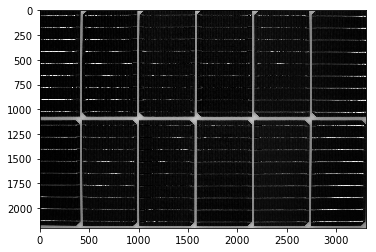

In [149]:
img = cv2.imread(r'C:\zhongjian\cut_pics\data\jiexianhe\cut_edge\SWG-LRP904100211102415224_7.jpg')
plt.imshow(img)

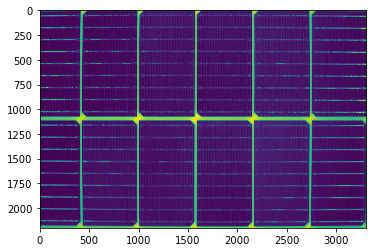

In [150]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
kernel =np.ones((11,1))/11
dst = cv2.filter2D(gray, -1, kernel)
plt.imshow(dst)

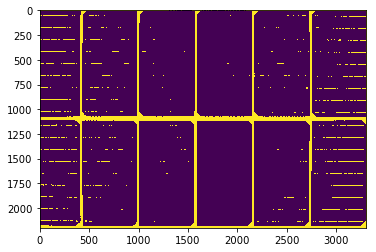

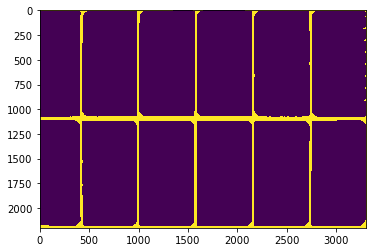

In [151]:
binary = cv2.threshold(dst, 0, 255, cv2.THRESH_OTSU)[1]
plt.imshow(binary)
plt.show()
img_blur = cv2.medianBlur(binary, 25)
plt.imshow(img_blur)
plt.show()

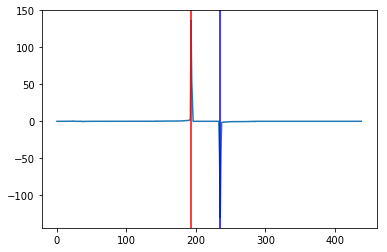

In [152]:
padded_row = int(cell_height*0.8)
padded_col = int(cell_height*0.25)

row_diff = np.diff(img_blur.mean(1)[padded_row: -padded_row])
col_diff = np.diff(img_blur.mean(0)[padded_col: -padded_col])
#     plt.plot(col_diff)
#     plt.show()
row_max = ss.argrelmax(row_diff, order=int(cell_height * 0.9))[0]
row_min = ss.argrelmin(row_diff[row_max[0]:], order=int(cell_height * 0.9))[0]
row_min = row_min+row_max[0]
plt.plot(row_diff)
for line in row_max:
    plt.axvline(line,c="r")
for line in row_min:
    plt.axvline(line,c="b")
plt.show()

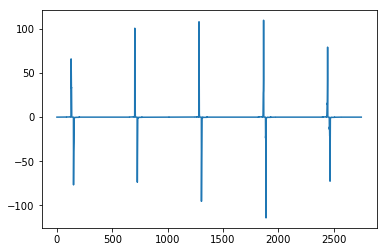

In [154]:
col_max = ss.argrelmax(col_diff, order=int(cell_height / 2 * 0.8))[0]
col_min = ss.argrelmin(col_diff, order=int(cell_height / 2 * 0.8))[0]
plt.plot(col_diff)
# for line in col_max:
#     plt.axvline(line,c="r")
# for line in col_min:
#     plt.axvline(line,c="b")
plt.show()

In [167]:
def insert_lines(array_lines):
    array_diff = np.diff(array_lines)
    index_max = np.argwhere(array_diff==max(array_diff))[0][0]
    list_lines = list(array_lines)
    num_insert = int(round(max(array_diff)/min(array_diff), 0))
    print(num_insert)
    for i in range(1, num_insert):
        list_lines.append(array_lines[index_max] + i*((array_lines[index_max+1]-array_lines[index_max])//num_insert))
    list_lines = sorted(list_lines)
    array_lines_res = np.array(list_lines)
    
    return array_lines_res

In [165]:
col_max
col_min

array([ 128,  703, 1283, 1866, 2444], dtype=int64)

array([ 150, 1305, 1888, 2466], dtype=int64)

In [163]:
array_diff
max(array_diff)
min(array_diff)

array([1155,  583,  578], dtype=int64)

1155

578

In [161]:
array_diff = np.diff(col_min)
max(array_diff)//min(array_diff)

1

In [166]:
insert_lines(col_min) 

2


array([ 150,  727, 1305, 1888, 2466], dtype=int64)

In [103]:
(2309-231)/516

4.0271317829457365

In [78]:
col_max_diff = np.diff(col_max)
col_min_diff = np.diff(col_min)
col_max_diff
col_min_diff

array([ 516, 1045,  517], dtype=int64)

array([516, 524, 522, 517], dtype=int64)

In [110]:
round(max(col_max_diff)//min(col_max_diff), 0)

2

In [117]:
index_max = np.argwhere(col_max_diff==max(col_max_diff))[0][0]
list_col_max = list(col_max)
num_insert = int(round(max(col_max_diff)//min(col_max_diff), 0))
for i in range(1, num_insert):
    list_col_max.append(col_max[index_max] + i*((col_max[index_max+1]-col_max[index_max])//num_insert))
list_col_max = sorted(list_col_max)
np.array(list_col_max)

array([ 231,  747, 1269, 1792, 2309], dtype=int64)

In [133]:
col_max = np.array([ 231, 1792, 2309])
insert_lines(col_max)

array([ 231,  751, 1271, 1792, 2309])

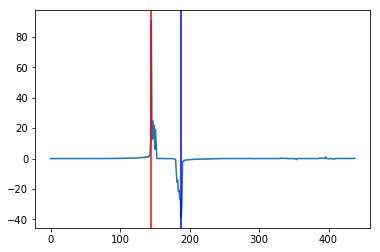

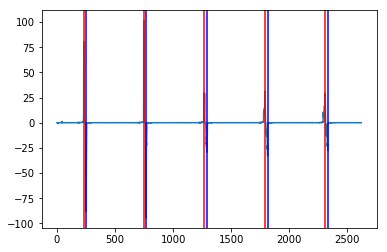

========col_max=========:[ 231  747 1266 1792 2309]
========col_min=========:[ 251  767 1291 1813 2330]


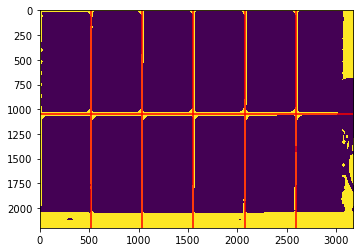

(array([1046]), array([ 516, 1032, 1553, 2077, 2594]))

In [45]:
get_cell_lines(img_blur, 1100, rows, cols)

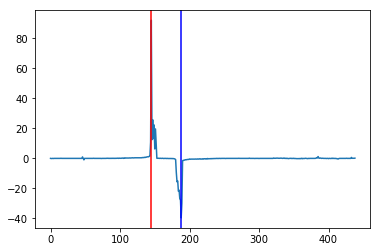

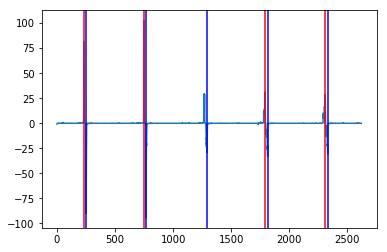

========col_max=========:[ 231  747 1792 2309]
========col_min=========:[ 251  767 1291 1813 2330]


AssertionError: col lines length error

In [47]:
get_cell_lines(gray, 1100, rows, cols)